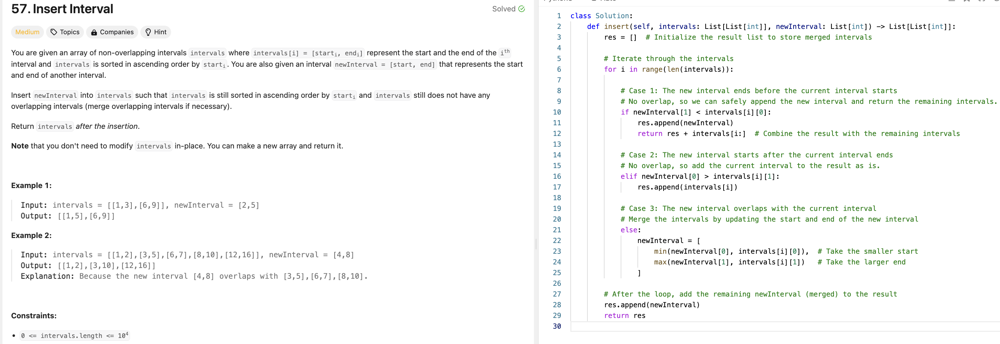

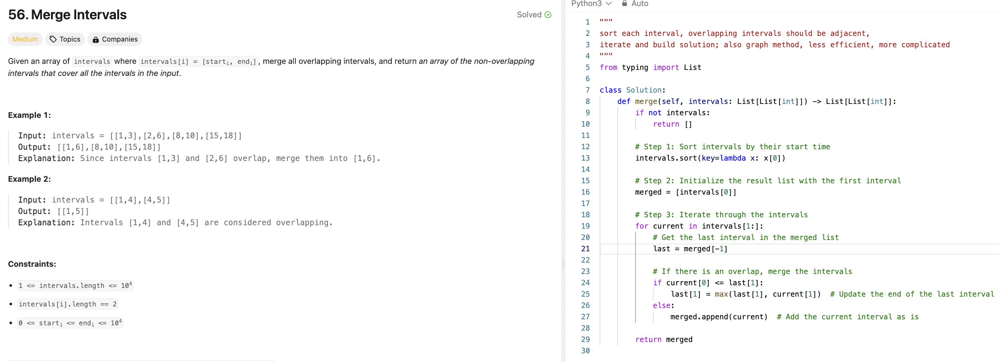

In [1]:
from typing import List

class Solution:
    def merge(self, intervals: List[List[int]]) -> List[List[int]]:
        if not intervals:
            return []

        # Step 1: Create events
        events = []
        for start, end in intervals:
            events.append((start, 1))  # Start event
            events.append((end, -1))  # End event

        # Step 2: Sort events
        # If times are the same, process "end events" (-1) before "start events" (+1)
        events.sort(key=lambda x: (x[0], x[1]))

        # Step 3: Sweep line
        merged = []
        active_intervals = 0
        current_start = None

        for time, event in events:
            if event == 1:  # Start of an interval
                if active_intervals == 0:
                    current_start = time  # Mark the start of a new merged interval
                active_intervals += 1
            elif event == -1:  # End of an interval
                active_intervals -= 1
                if active_intervals == 0:
                    merged.append([current_start, time])  # Mark the end of the merged interval

        return merged


In [2]:
intervals = [[1,3],[2,6],[8,10],[15,18]]

Solution().merge(intervals)



[[1, 6], [8, 10], [15, 18]]

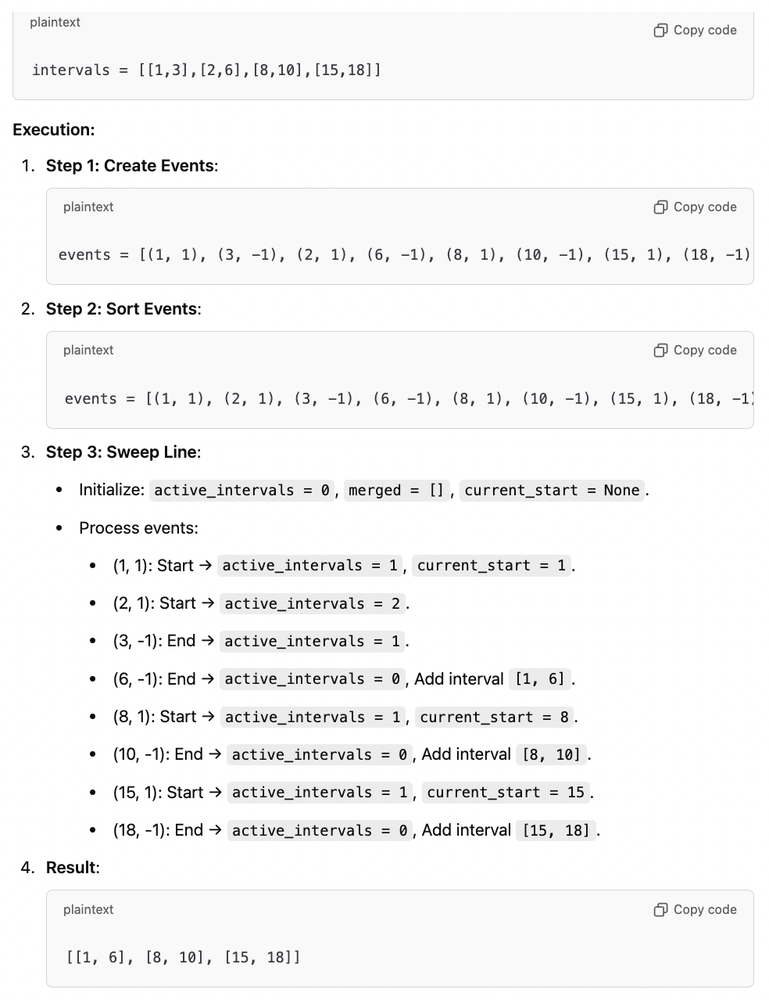

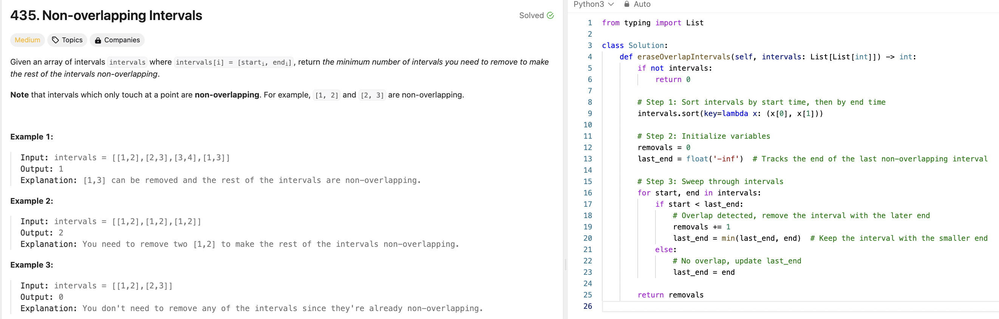

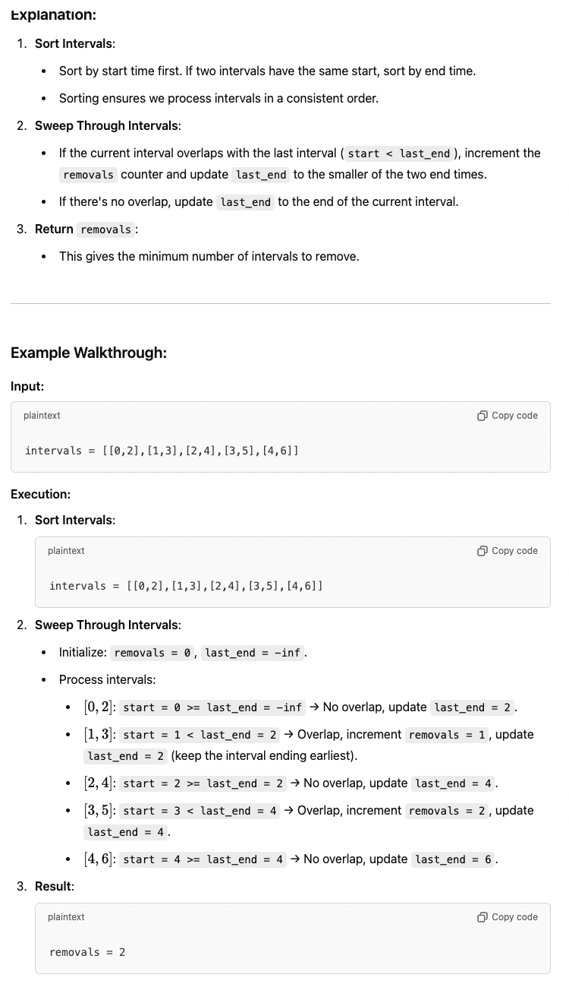

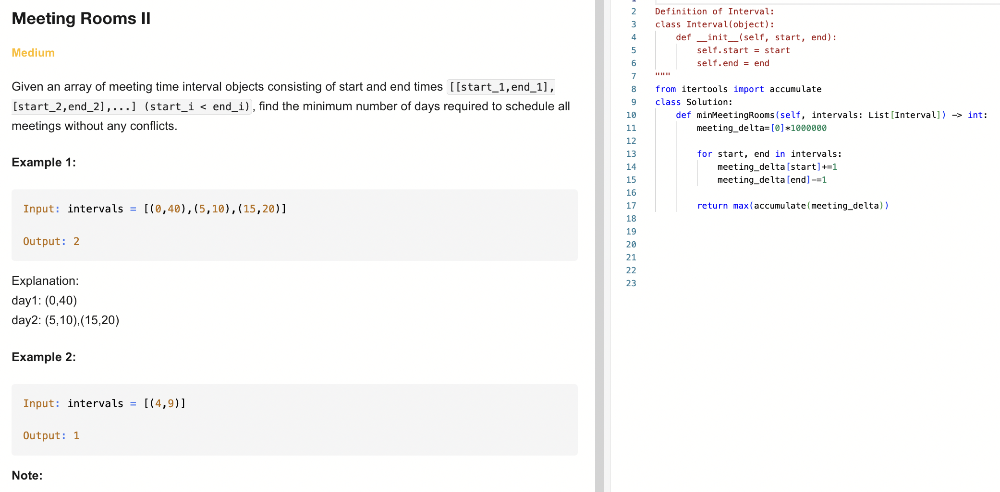

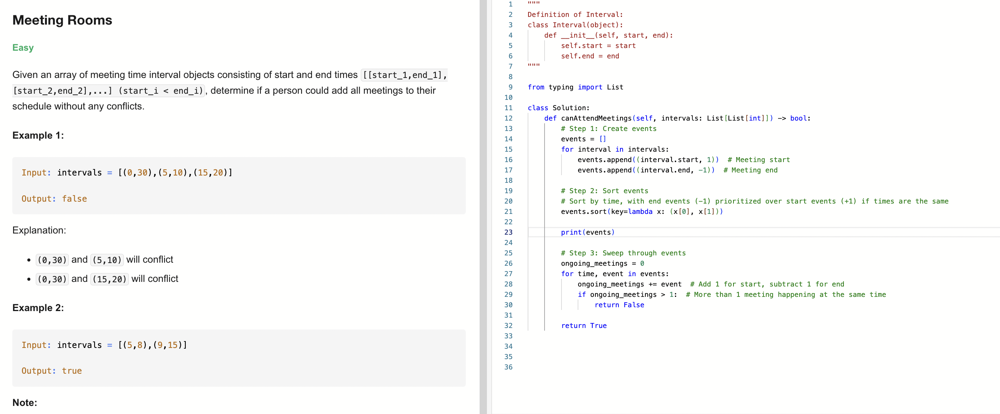

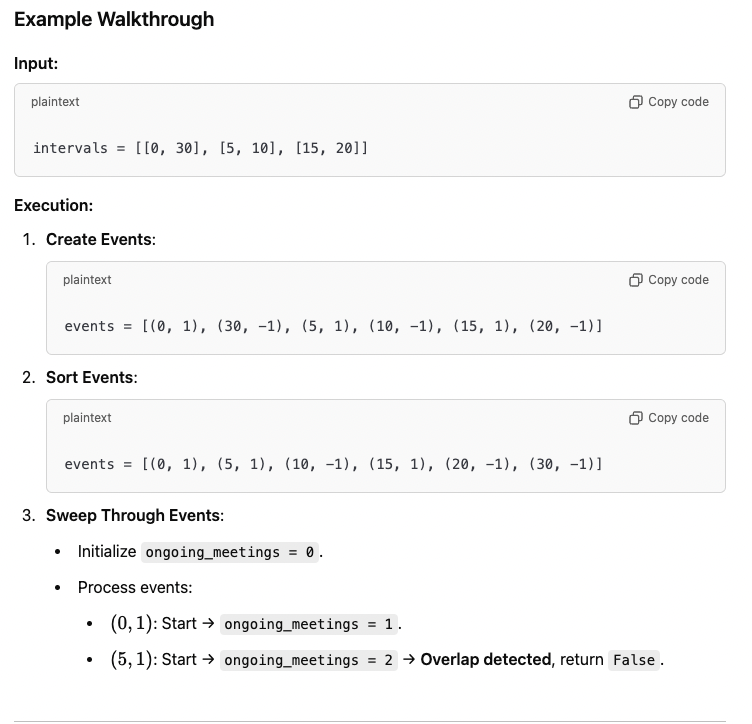

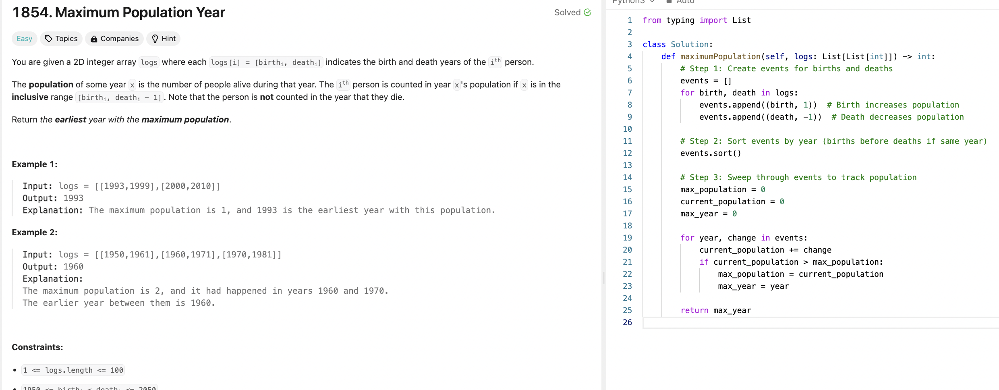

- 850. Rectangle Area II
- 218. The Skyline Problem
- 452. Minimum Number of Arrows to Burst Balloons 
- 2848. Points That Intersect With Cars 
- 1094. Car Pooling
- 1229. Meeting Scheduler 
- 1943. Describe the Painting 
- 1353. Maximum Number of Events That Can Be Attended
- 2251. Number of Flowers in Full Bloom

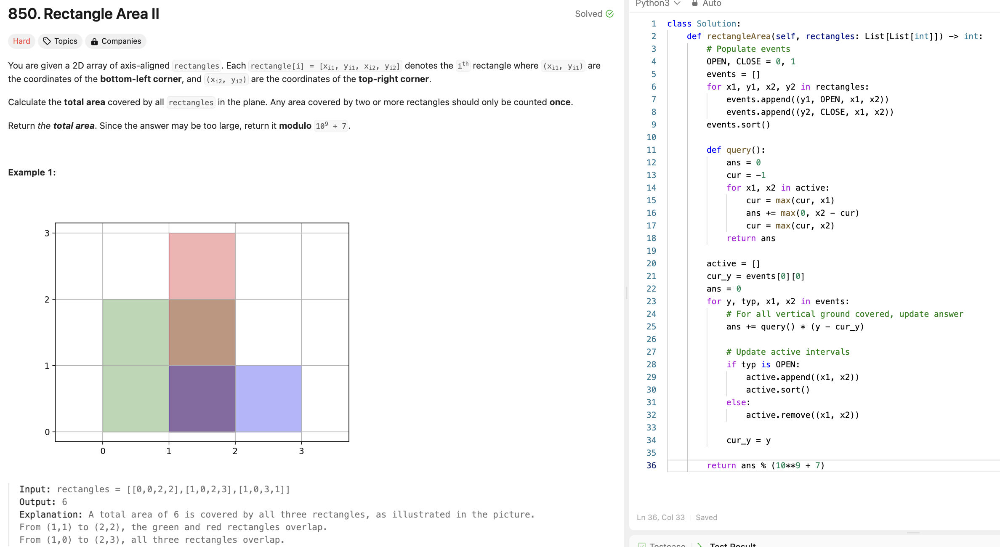

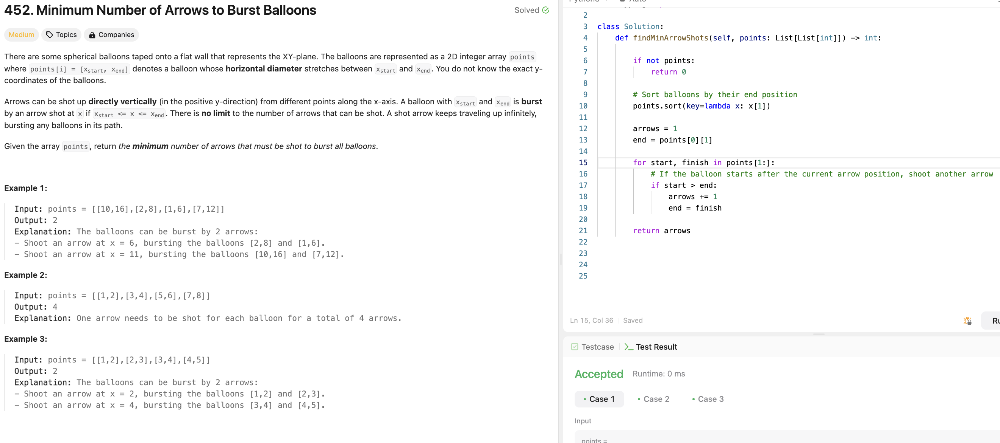

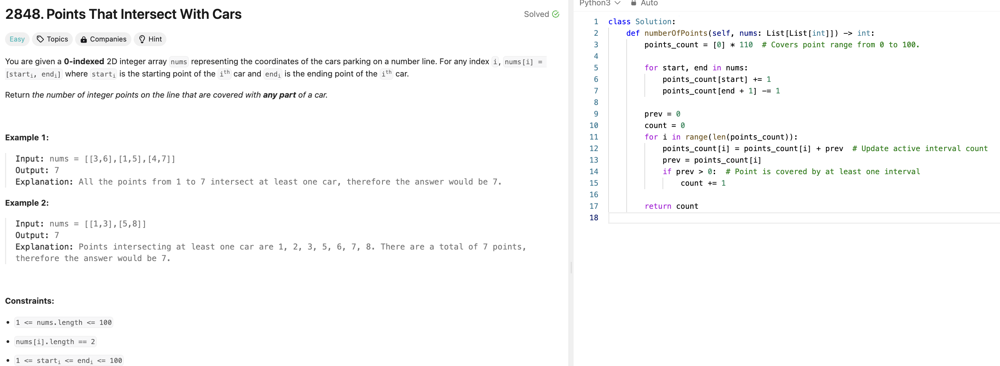

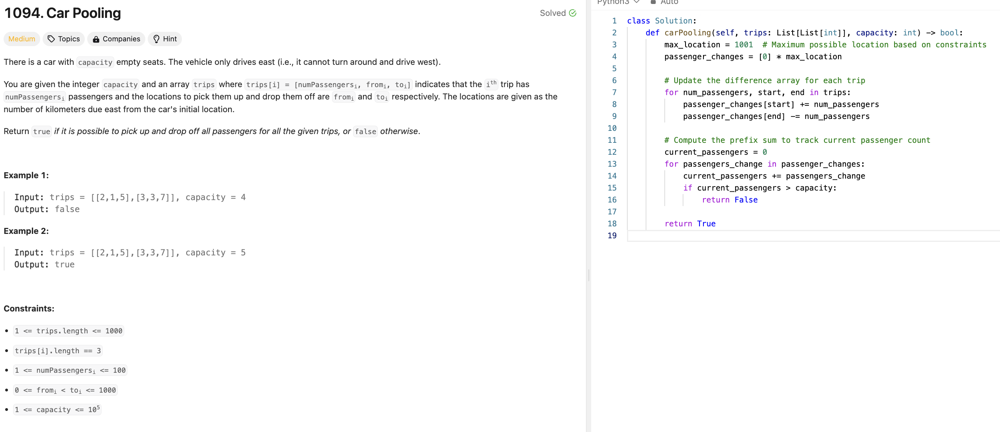

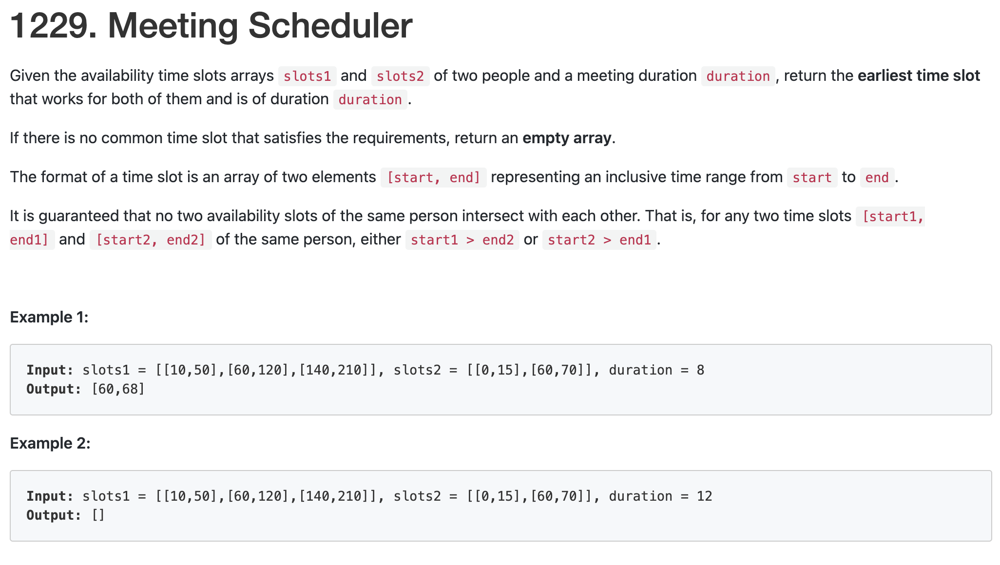

In [2]:
from typing import *
class Solution:
    def minAvailableDuration(self, slots1: List[List[int]], slots2: List[List[int]], duration: int) -> List[int]:
        # Step 1: Combine all intervals into a list of events
        events = []
        for start, end in slots1:
            events.append((start, 1))  # Start event
            events.append((end, -1))  # End event
        for start, end in slots2:
            events.append((start, 1))
            events.append((end, -1))
        
        # Step 2: Sort events by time, breaking ties with end events first
        events.sort()
        
        # Step 3: Sweep line to find the first suitable duration
        active = 0
        prev_time = None
        for time, change in events:
            if active == 2:  # Both people are available
                if time - prev_time >= duration:
                    return [prev_time, prev_time + duration]
            active += change
            prev_time = time if active == 2 else prev_time  # Update when both are available
        
        # Step 4: No suitable slot found
        return []


In [3]:
slots1 = [[10, 50], [60, 120], [140, 210]]
slots2 = [[0, 15], [60, 70]]
duration = 8
Solution().minAvailableDuration(slots1,slots2,duration)

[60, 68]

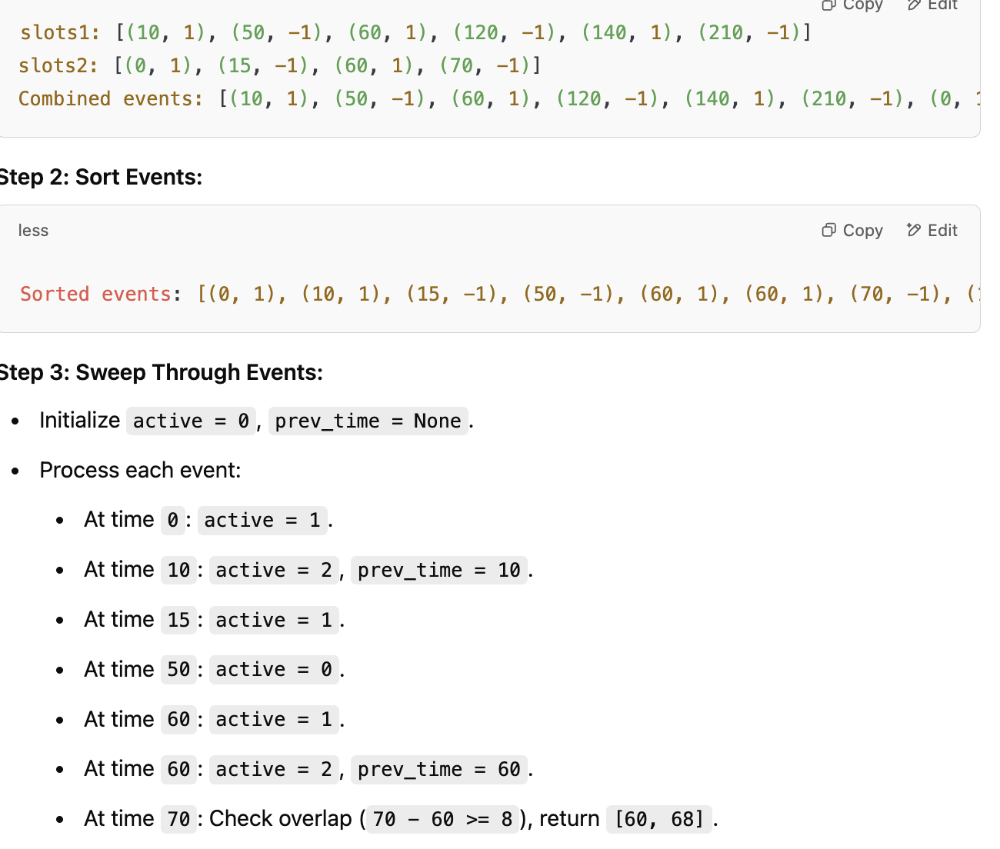

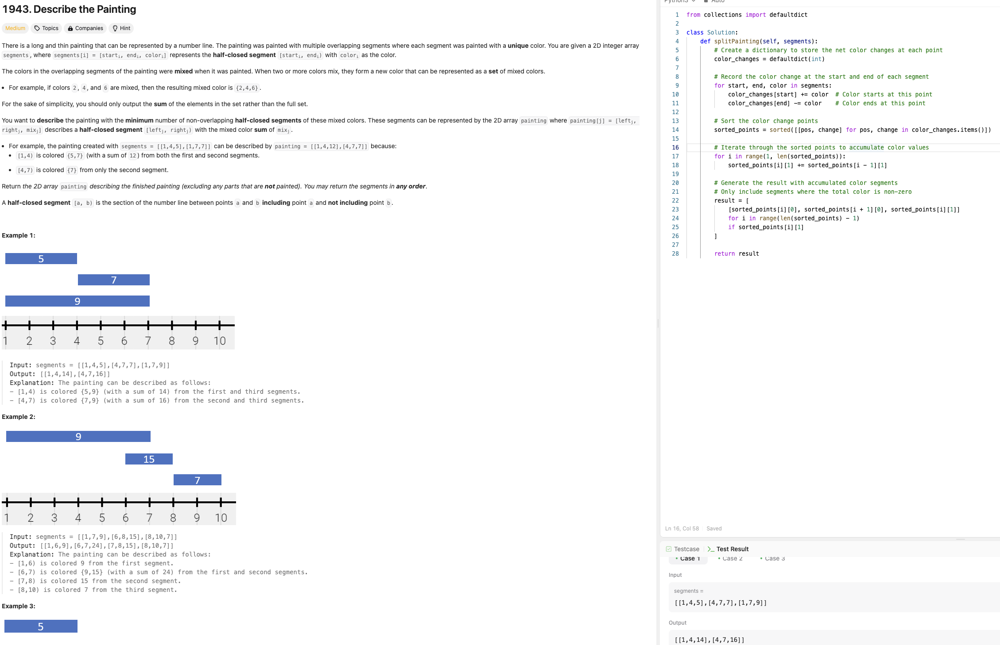

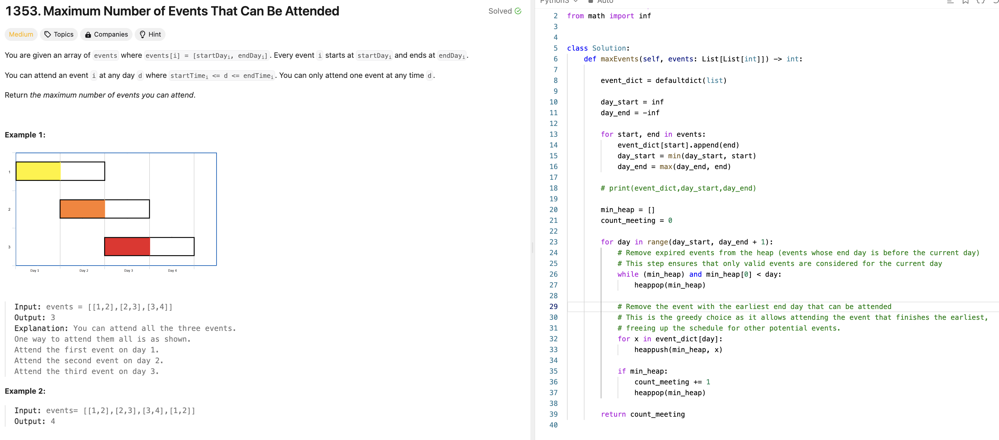